# Training & Testing Script for Mobilenet SSD

In [ ]:
#Run this cell to train the SSD model.
#Before you start, please set the necessary arguments at TODO.

import sys
sys.path.append("../SystemCode")
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard
from keras import backend as K
from math import ceil

from ssd300 import ssd_mobilenet
from ssd300  import keras_ssd_loss
from ssd300 import ssd_box_encode_decode_utils
from ssd300 import ssd_batch_generator
#from keras.utils.training_utils import multi_gpu_model
import os
import argparse
os.environ['CUDA_VISIBLE_DEVICES'] = "1"

#---------------------------------------------------------------------------------#
# TODO: Set the necessary arguments for training
weight_file = "../Miscellaneous/weights/mobilenet.h5"  #path to mobilenet weight file
img_dir_path = '../Miscellaneous/data'  #path to data
batch_size = 32  #batch size 
checkpoint_directory = '../Miscellaneous/checkpoints'  #directory to save the checkpoints
epochs = 250  #number of epochs
intial_epoch = 0
#---------------------------------------------------------------------------------#

img_height = 300  # Height of the input images
img_width = 300  # Width of the input images
img_channels = 3  # Number of color channels of the input images
subtract_mean = [123, 117, 104]  # The per-channel mean of the images in the dataset
swap_channels = True  # The color channel order in the original SSD is BGR
n_classes = 6  # Number of positive classes, e.g. 20 for Pascal VOC, 80 for MS COCO
scales_voc = [0.1, 0.2, 0.37, 0.54, 0.71, 0.88,
              1.05]  # The anchor box scaling factors used in the original SSD300 for the Pascal VOC datasets
scales_coco = [0.07, 0.15, 0.33, 0.51, 0.69, 0.87,
               1.05]  # The anchor box scaling factors used in the original SSD300 for the MS COCO datasets
scales = scales_voc

# aspect_ratios = [[1.0, 2.0, 0.5],
#                  [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
#                  [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
#                  [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
#                  [1.0, 2.0, 0.5],
#                  [1.0, 2.0, 0.5]]  # The anchor box aspect ratios used in the original SSD300; the order matters

aspect_ratios = [[1.0, 2.0, 0.5],
                 [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
                 [1.0, 2.0, 0.5],
                 [1.0, 2.0, 0.5]] 

two_boxes_for_ar1 = True
steps = [8, 16, 32, 64, 100, 300]  # The space between two adjacent anchor box center points for each predictor layer.
offsets = [0.5, 0.5, 0.5, 0.5, 0.5,
           0.5]  # The offsets of the first anchor box center points from the top and left borders of the image as a fraction of the step size for each predictor layer.
limit_boxes = False  # Whether or not you want to limit the anchor boxes to lie entirely within the image boundaries
variances = [0.1, 0.1, 0.2,
             0.2]  # The variances by which the encoded target coordinates are scaled as in the original implementation
coords = 'centroids'  # Whether the box coordinates to be used as targets for the model should be in the 'centroids', 'corners', or 'minmax' format, see documentation
normalize_coords = True

# 1: Build the Keras model

K.clear_session()  # Clear previous models from memory.
#ssd_mobilenet = ssd_mobilenet()
# def train():
model = ssd_mobilenet.ssd_300(mode = 'training',
              image_size=(img_height, img_width, img_channels),
              n_classes=n_classes,
              l2_regularization=0.0005,
              scales=scales,
              aspect_ratios_per_layer=aspect_ratios,
              two_boxes_for_ar1=two_boxes_for_ar1,
              steps=steps,
              offsets=offsets,
              limit_boxes=limit_boxes,
              variances=variances,
              coords=coords,
              normalize_coords=normalize_coords,
              subtract_mean=subtract_mean,
              divide_by_stddev=None,
              swap_channels=swap_channels)



model.load_weights(weight_file, by_name=True,skip_mismatch=True)


predictor_sizes = [model.get_layer('conv11_mbox_conf').output_shape[1:3],
                 model.get_layer('conv13_mbox_conf').output_shape[1:3],
                 model.get_layer('conv14_2_mbox_conf').output_shape[1:3],
                 model.get_layer('conv15_2_mbox_conf').output_shape[1:3],
                 model.get_layer('conv16_2_mbox_conf').output_shape[1:3],
                 model.get_layer('conv17_2_mbox_conf').output_shape[1:3]]

adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=5e-04)

ssd_loss = keras_ssd_loss.SSDLoss(neg_pos_ratio=3, n_neg_min=0, alpha=1.0)


model.compile(optimizer=adam, loss=ssd_loss.compute_loss)


train_dataset = ssd_batch_generator.BatchGenerator(box_output_format=['class_id', 'xmin', 'ymin', 'xmax', 'ymax'])
val_dataset = ssd_batch_generator.BatchGenerator(box_output_format=['class_id', 'xmin', 'ymin', 'xmax', 'ymax'])

# 2: Parse the image and label lists for the training and validation datasets. This can take a while.

Train_images_dir = img_dir_path + '/images/'
Val_images_dir = img_dir_path + '/images/'
Train_annotations_dir = img_dir_path + '/annotations/'
Train_image_set_filename = img_dir_path + '/imageSets/trainval.txt'
Val_image_set_filename = img_dir_path + '/imageSets/test.txt'

# The XML parser needs to now what object class names to look for and in which order to map them to integers.

classes = ['background','Player', 'Gun', 'Vehicle', 'House', 'Tree','Plane']

train_dataset.parse_xml(images_dirs=[Train_images_dir],
                          image_set_filenames=[Train_image_set_filename],
                          annotations_dirs=[Train_annotations_dir],
                          classes=classes,
                          include_classes='all',
                          exclude_truncated=False,
                          exclude_difficult=False,
                          ret=False,
                          percent=1)

val_dataset.parse_xml(images_dirs=[Val_images_dir],
                        image_set_filenames=[Val_image_set_filename],
                        annotations_dirs=[Train_annotations_dir],
                        classes=classes,
                        include_classes='all',
                        exclude_truncated=False,
                        exclude_difficult=False,
                        ret=False
                        )

  # 3: Instantiate an encoder that can encode ground truth labels into the format needed by the SSD loss function.

ssd_box_encoder = ssd_box_encode_decode_utils.SSDBoxEncoder(img_height=img_height,
                                  img_width=img_width,
                                  n_classes=n_classes,
                                  predictor_sizes=predictor_sizes,
                                  min_scale=None,
                                  max_scale=None,
                                  scales=scales,
                                  aspect_ratios_global=None,
                                  aspect_ratios_per_layer=aspect_ratios,
                                  two_boxes_for_ar1=two_boxes_for_ar1,
                                  steps=steps,
                                  offsets=offsets,
                                  limit_boxes=limit_boxes,
                                  variances=variances,
                                  pos_iou_threshold=0.5,
                                  neg_iou_threshold=0.2,
                                  coords=coords,
                                  normalize_coords=normalize_coords)



train_generator = train_dataset.generate(batch_size=batch_size,
                                           shuffle=True,
                                           train=True,
                                           ssd_box_encoder=ssd_box_encoder,
                                           convert_to_3_channels=True,
                                           equalize=False,
                                           brightness=(0.5, 2, 0.5),
                                           flip=0.5,
                                           translate=False,
                                           scale=False,
                                           max_crop_and_resize=(img_height, img_width, 1, 3),
                                           # This one is important because the Pascal VOC images vary in size
                                           random_pad_and_resize=(img_height, img_width, 1, 3, 0.5),
                                           # This one is important because the Pascal VOC images vary in size
                                           random_crop=False,
                                           crop=False,
                                           resize=False,
                                           gray=False,
                                           limit_boxes=True,
                                           # While the anchor boxes are not being clipped, the ground truth boxes should be
                                           include_thresh=0.4)

val_generator = val_dataset.generate(batch_size=batch_size,
                                       shuffle=True,
                                       train=True,
                                       ssd_box_encoder=ssd_box_encoder,
                                       convert_to_3_channels=True,
                                       equalize=False,
                                       brightness=(0.5, 2, 0.5),
                                       flip=0.5,
                                       translate=False,
                                       scale=False,
                                       max_crop_and_resize=(img_height, img_width, 1, 3),
                                       # This one is important because the Pascal VOC images vary in size
                                       random_pad_and_resize=(img_height, img_width, 1, 3, 0.5),
                                       # This one is important because the Pascal VOC images vary in size
                                       random_crop=False,
                                       crop=False,
                                       resize=False,
                                       gray=False,
                                       limit_boxes=True,
                                       # While the anchor boxes are not being clipped, the ground truth boxes should be
                                       include_thresh=0.4)
# Get the number of samples in the training and validations datasets to compute the epoch lengths below.
n_train_samples = train_dataset.get_n_samples()
n_val_samples = val_dataset.get_n_samples()

def lr_schedule(epoch):
    if epoch <= 300:
        return 0.001
    else:
        return 0.0001

learning_rate_scheduler = LearningRateScheduler(schedule=lr_schedule)
checkpoint_path = checkpoint_directory + "/ssd300_epoch-{epoch:02d}.h5"

checkpoint = ModelCheckpoint(checkpoint_path)

log_path = checkpoint_directory + "/logs"

tensorborad = TensorBoard(log_dir=log_path,
                            histogram_freq=0, write_graph=True, write_images=False)

callbacks = [checkpoint, tensorborad, learning_rate_scheduler]


history = model.fit_generator(generator=train_generator,
                                steps_per_epoch=ceil(n_train_samples) / batch_size,
                                verbose=1,
                                initial_epoch=intial_epoch,
                                epochs=epochs,
                                validation_data=val_generator,
                                validation_steps=ceil(n_val_samples) / batch_size,
                                callbacks=callbacks
                                )






conv1 shape:  (?, 150, 150, 64)
conv3 shape:  (?, 75, 75, 128)
conv5 shape:  (?, 38, 38, 256)
conv11 shape:  (?, 19, 19, 512)
conv13 shape:  (?, 10, 10, 1024)
conv14 shape (?, 5, 5, 512)
conv15 shape (?, 3, 3, 256)
conv16 shape (?, 2, 2, 256)
conv17 shape (?, 1, 1, 128)
in training mode
../Miscellaneous/data/test_images/13.PUBG-pickup-1-560x331.jpg
time taken by ssd 1.035309076309204
class id: 1
score: 0.865321934223175
bounding box: 179 386 162 324
class id: 1
score: 0.3044125437736511
bounding box: 90 257 152 314
class id: 1
score: 0.2508157193660736
bounding box: 69 328 119 286
class id: 3
score: 0.9835333228111267
bounding box: 22 473 95 301
class id: 3
score: 0.3265576660633087
bounding box: 69 328 119 286
class id: 5
score: 0.25114476680755615
bounding box: 370 557 -4 106


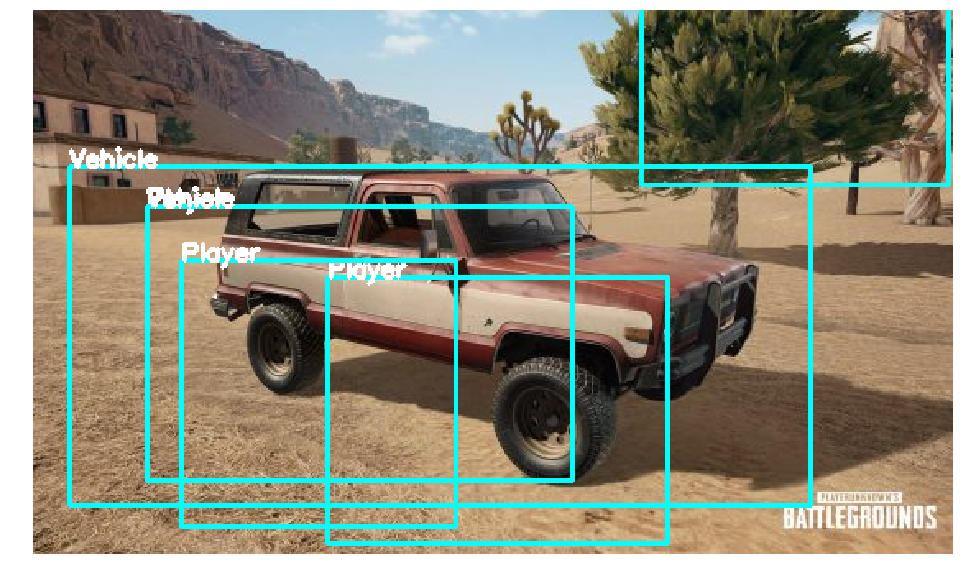

../Miscellaneous/data/test_images/scene06751video7.jpg
time taken by ssd 0.37123894691467285
class id: 1
score: 0.7766649127006531
bounding box: 322 988 423 724


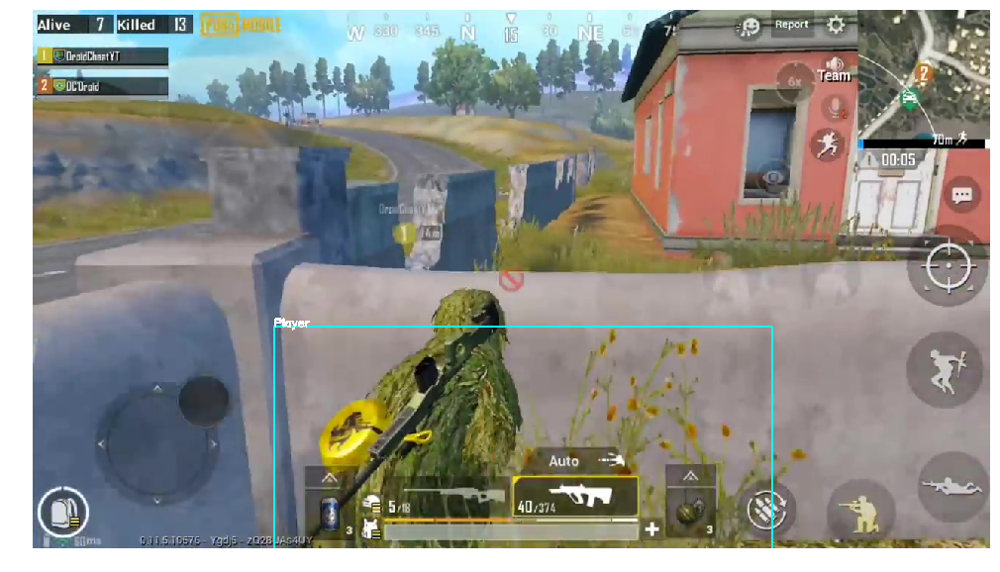

../Miscellaneous/data/test_images/scene10951video4.jpg
time taken by ssd 0.3982667922973633
class id: 1
score: 0.36914682388305664
bounding box: 266 719 364 685
class id: 5
score: 0.9944033622741699
bounding box: 119 588 122 388
class id: 5
score: 0.8224221467971802
bounding box: 57 340 145 368
class id: 5
score: 0.8220295906066895
bounding box: 860 1269 76 405
class id: 5
score: 0.46994808316230774
bounding box: 198 506 279 516
class id: 5
score: 0.4543568789958954
bounding box: 160 431 139 333
class id: 5
score: 0.4529953598976135
bounding box: 276 795 122 365
class id: 5
score: 0.42266029119491577
bounding box: 6 214 167 352
class id: 5
score: 0.4132741093635559
bounding box: 225 510 178 390
class id: 5
score: 0.3842335641384125
bounding box: 235 522 117 290
class id: 5
score: 0.33969566226005554
bounding box: 200 655 180 454
class id: 5
score: 0.3148863613605499
bounding box: 376 635 195 334
class id: 5
score: 0.3012000024318695
bounding box: 92 421 210 396
class id: 5
score: 0.263

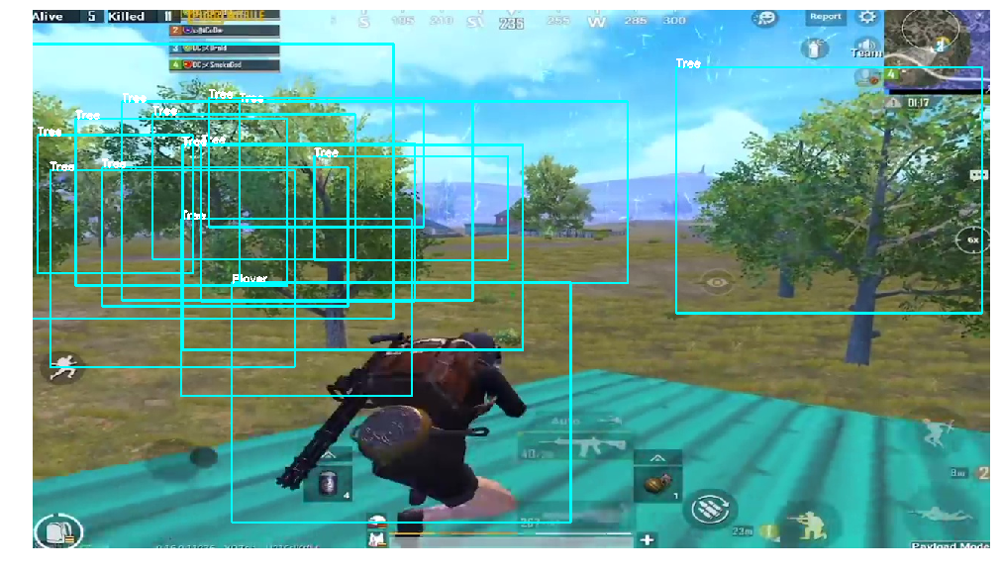

../Miscellaneous/data/test_images/scene10501video4.jpg
time taken by ssd 0.3569662570953369
class id: 5
score: 0.3508157432079315
bounding box: 900 999 79 149
class id: 5
score: 0.3146849274635315
bounding box: 803 1126 313 469
class id: 5
score: 0.2743132710456848
bounding box: 1009 1185 165 252
class id: 6
score: 0.880664050579071
bounding box: 200 765 276 497
class id: 6
score: 0.3020331561565399
bounding box: 803 1126 313 469
class id: 6
score: 0.25432077050209045
bounding box: 417 890 295 491


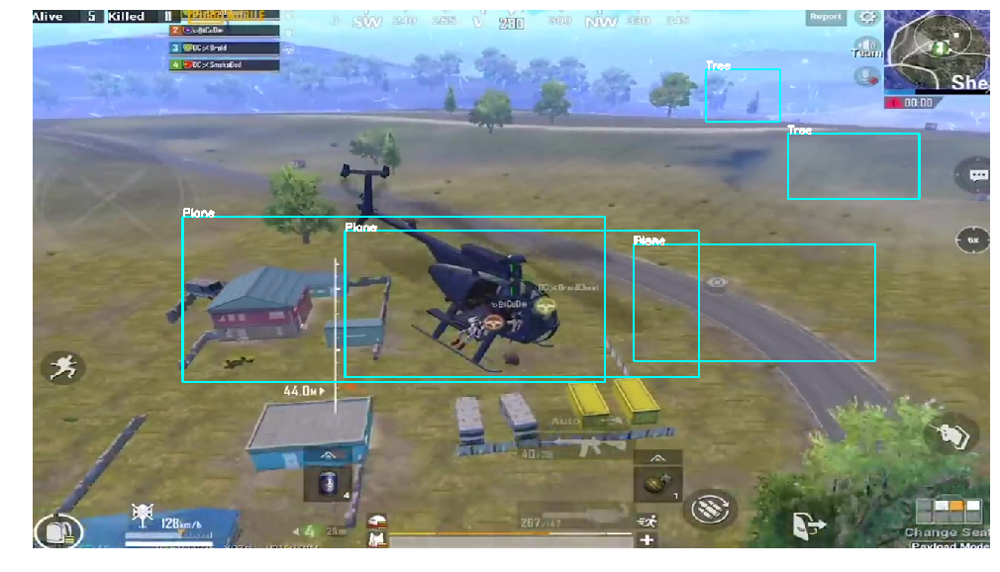

../Miscellaneous/data/test_images/65.pubg-vehicle-playerunknowns-battlegrounds-uhdpaper.com-4K-75.jpg
time taken by ssd 0.36559009552001953
class id: 1
score: 0.5627990961074829
bounding box: 436 705 176 471
class id: 1
score: 0.47324246168136597
bounding box: 103 441 149 470
class id: 1
score: 0.44298702478408813
bounding box: 586 897 206 393
class id: 1
score: 0.4014603793621063
bounding box: 663 926 135 475
class id: 3
score: 0.26478496193885803
bounding box: 586 897 206 393


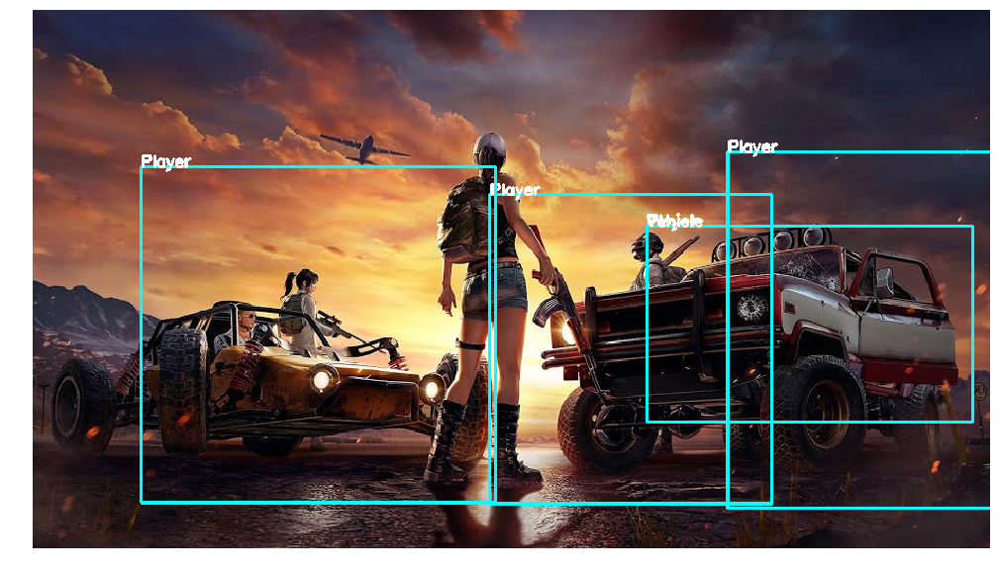

../Miscellaneous/data/test_images/scene10351video4.jpg
time taken by ssd 0.453078031539917
class id: 5
score: 0.7461349964141846
bounding box: 1012 1211 294 416
class id: 5
score: 0.7126378417015076
bounding box: 488 801 249 430
class id: 5
score: 0.5713023543357849
bounding box: 546 764 233 364
class id: 5
score: 0.5331363081932068
bounding box: 1035 1235 206 348
class id: 5
score: 0.48518866300582886
bounding box: 326 700 232 425
class id: 5
score: 0.44796937704086304
bounding box: 826 987 210 349
class id: 5
score: 0.3720598518848419
bounding box: 1123 1216 326 428
class id: 5
score: 0.3555203080177307
bounding box: 265 481 222 356
class id: 5
score: 0.3343430161476135
bounding box: 656 869 228 355
class id: 5
score: 0.33035585284233093
bounding box: 195 564 215 408
class id: 5
score: 0.325246125459671
bounding box: 750 940 283 412
class id: 5
score: 0.313777357339859
bounding box: 820 1053 285 421
class id: 5
score: 0.3072713613510132
bounding box: 664 869 272 394
class id: 5
score

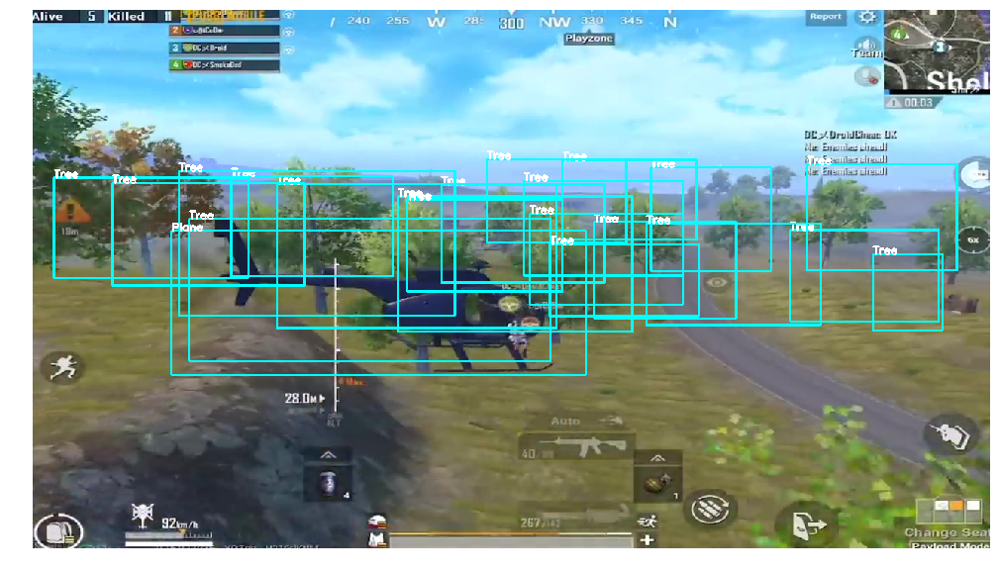

../Miscellaneous/data/test_images/scene06151video7.jpg
time taken by ssd 0.5072779655456543
class id: 1
score: 0.429662823677063
bounding box: 348 1054 389 721
class id: 1
score: 0.2739027738571167
bounding box: 430 820 421 707


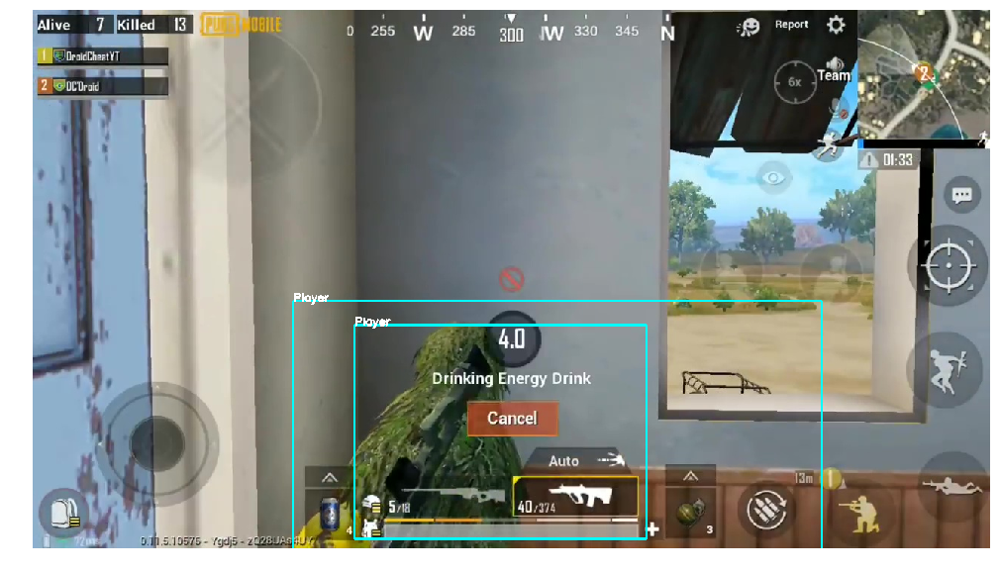

../Miscellaneous/data/test_images/scene06451video7.jpg
time taken by ssd 0.3304939270019531
class id: 4
score: 0.48861220479011536
bounding box: -14 343 213 373
class id: 4
score: 0.26560163497924805
bounding box: -46 345 100 412


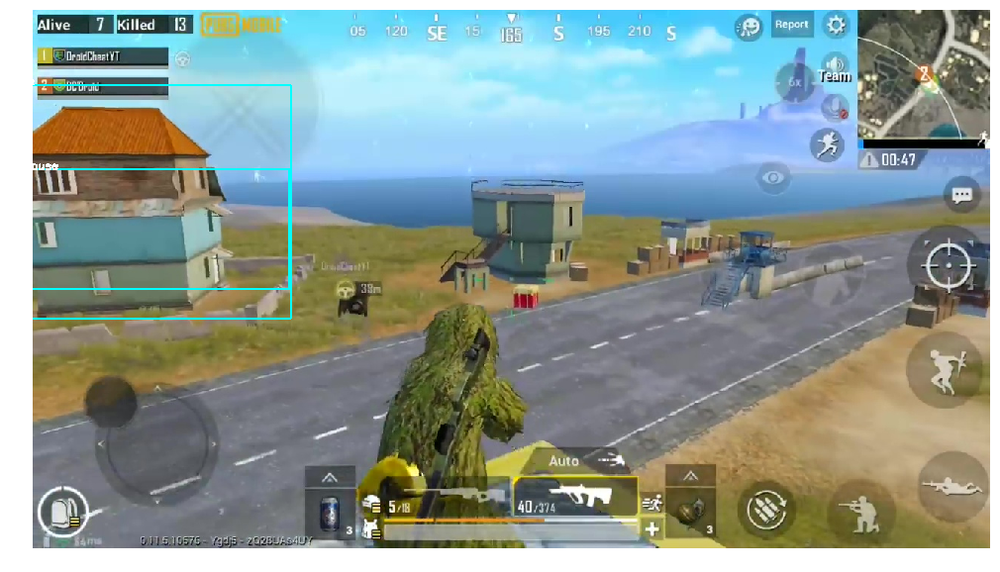

../Miscellaneous/data/test_images/47.pubg-vehicle-nerf-update-xbox-one_feature.jpg
time taken by ssd 0.29875683784484863
class id: 1
score: 0.7732865214347839
bounding box: 273 780 268 928
class id: 1
score: 0.55443274974823
bounding box: 698 1345 282 913
class id: 1
score: 0.3943035304546356
bounding box: 1129 1686 463 762
class id: 1
score: 0.305576890707016
bounding box: 857 1540 373 812
class id: 1
score: 0.3024207651615143
bounding box: 106 1178 260 928
class id: 1
score: 0.2635501027107239
bounding box: 393 916 317 834
class id: 3
score: 0.4161320924758911
bounding box: 106 1178 260 928


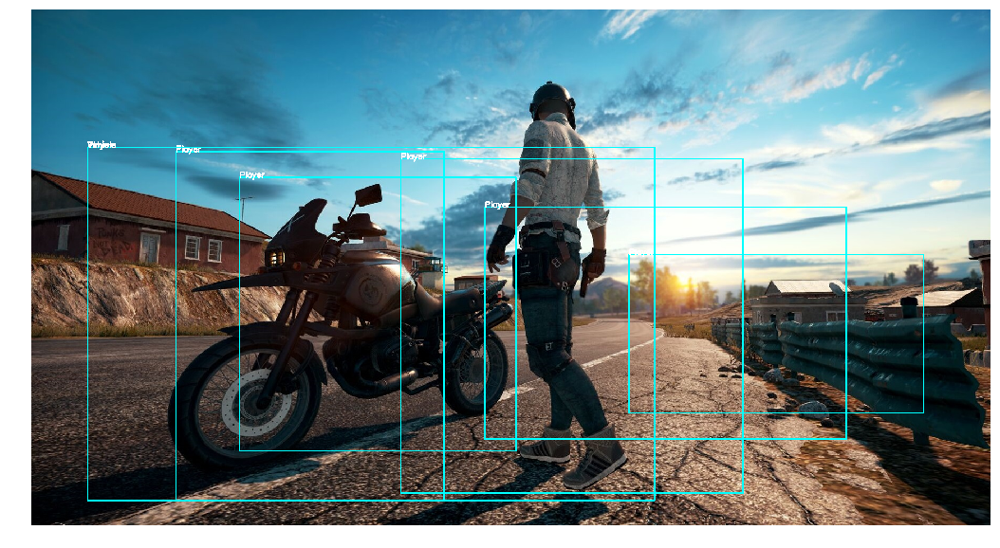

../Miscellaneous/data/test_images/scene10651video4.jpg
time taken by ssd 0.3336310386657715
class id: 5
score: 0.6807646155357361
bounding box: 1052 1211 335 431
class id: 5
score: 0.42203086614608765
bounding box: 1047 1206 208 308
class id: 5
score: 0.3164241313934326
bounding box: 1119 1207 344 432
class id: 5
score: 0.26599815487861633
bounding box: 878 972 239 315
class id: 5
score: 0.2504948675632477
bounding box: 778 947 311 409
class id: 6
score: 0.4676383435726166
bounding box: 220 783 298 481


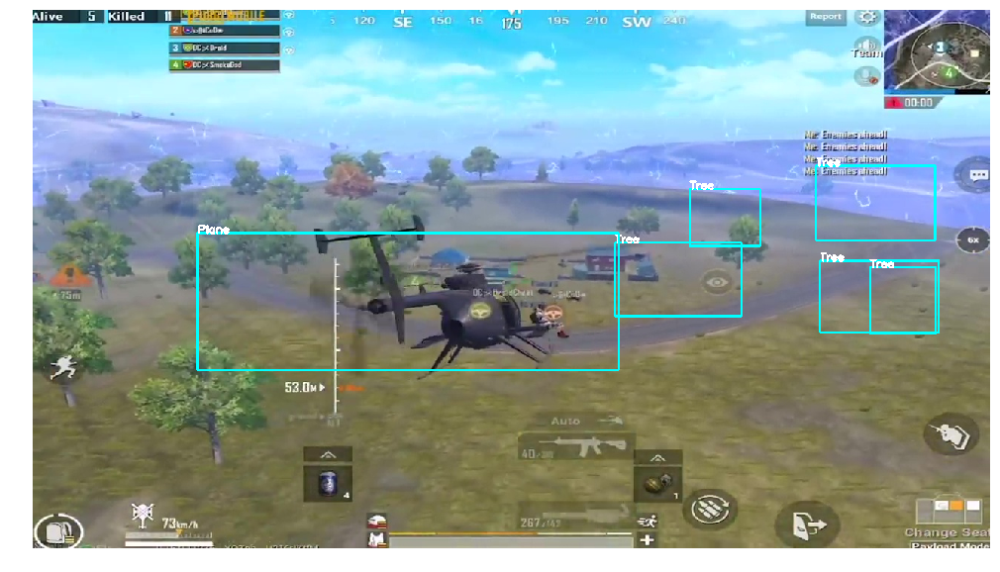

../Miscellaneous/data/test_images/scene06601video7.jpg
time taken by ssd 0.30231714248657227
class id: 1
score: 0.7107798457145691
bounding box: 449 878 388 706


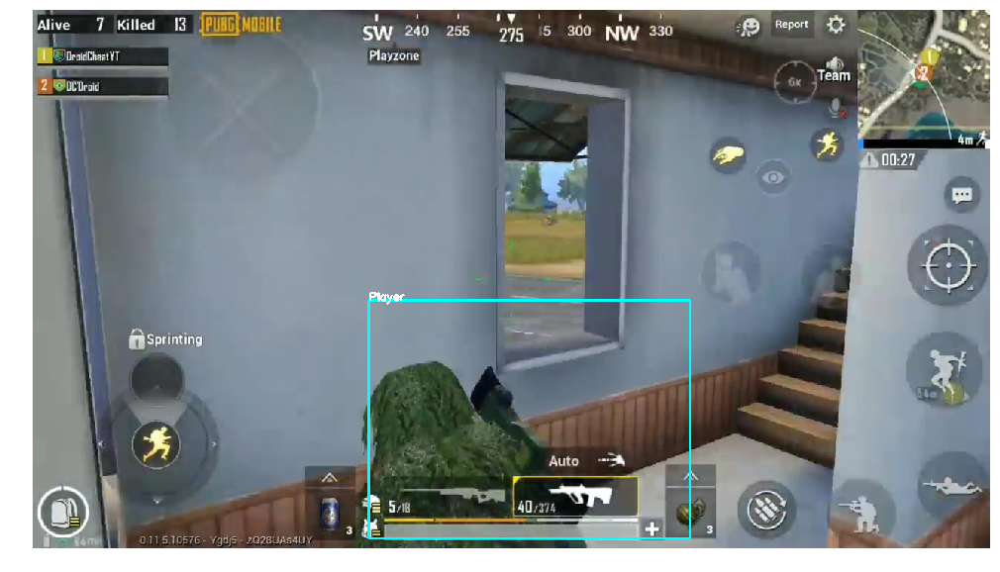

../Miscellaneous/data/test_images/scene06301video7.jpg
time taken by ssd 0.3179481029510498
class id: 1
score: 0.6183894276618958
bounding box: 292 962 393 707
class id: 1
score: 0.3891288936138153
bounding box: 445 788 416 705
class id: 2
score: 0.31342121958732605
bounding box: 445 788 416 705


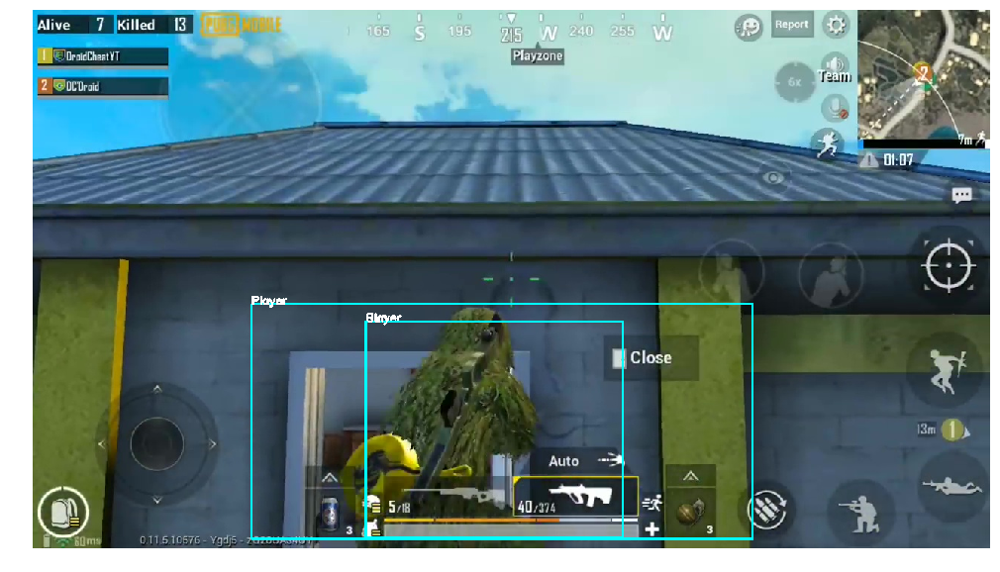

../Miscellaneous/data/test_images/scene10201video4.jpg
time taken by ssd 0.30002617835998535
class id: 1
score: 0.44964665174484253
bounding box: 466 770 406 689
class id: 5
score: 0.8786938190460205
bounding box: 155 455 212 421
class id: 5
score: 0.7211456298828125
bounding box: 245 551 206 439
class id: 5
score: 0.5962991118431091
bounding box: 97 402 186 359
class id: 5
score: 0.5044363141059875
bounding box: 189 493 299 528
class id: 5
score: 0.500801682472229
bounding box: 65 364 219 435
class id: 5
score: 0.4772600531578064
bounding box: 974 1197 297 415
class id: 5
score: 0.3276619017124176
bounding box: 311 648 273 444
class id: 5
score: 0.2918926179409027
bounding box: 54 346 275 515
class id: 5
score: 0.28104010224342346
bounding box: 234 474 194 357


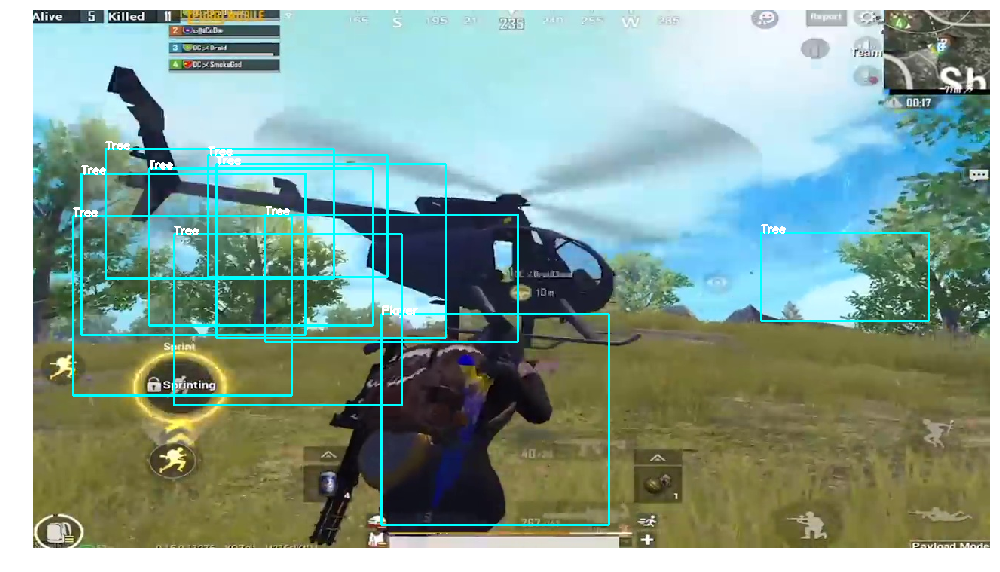

../Miscellaneous/data/test_images/scene06901video7.jpg
time taken by ssd 0.30118799209594727
class id: 1
score: 0.2875194549560547
bounding box: 254 603 470 712
class id: 4
score: 0.7653546929359436
bounding box: -34 641 -5 413


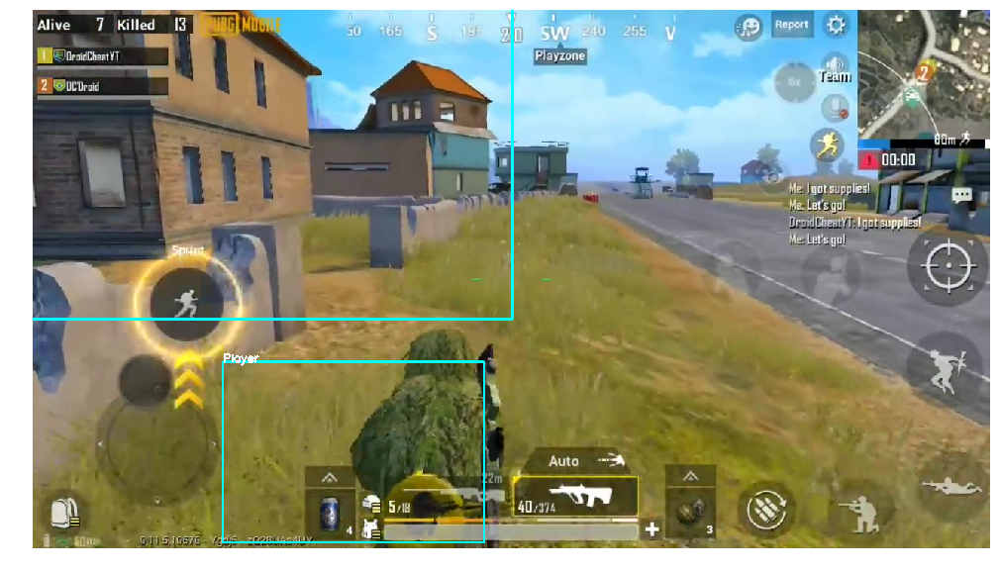

../Miscellaneous/data/test_images/23.pubg-xbox-one-x-screenshot.jpg
time taken by ssd 0.2924458980560303
class id: 1
score: 0.890168309211731
bounding box: 886 1632 877 1575
class id: 1
score: 0.7684706449508667
bounding box: 339 950 790 1547
class id: 3
score: 0.9978293776512146
bounding box: 81 2252 606 1433
class id: 3
score: 0.8187800049781799
bounding box: 630 2036 764 1508
class id: 3
score: 0.7863318920135498
bounding box: 246 1795 485 1230
class id: 3
score: 0.39380452036857605
bounding box: 309 1229 679 1487
class id: 5
score: 0.7741718292236328
bounding box: 738 1331 47 427
class id: 5
score: 0.7121202945709229
bounding box: 949 1716 26 444
class id: 5
score: 0.646808385848999
bounding box: 1266 1784 72 426
class id: 5
score: 0.6329285502433777
bounding box: 476 1058 45 389
class id: 5
score: 0.6119229197502136
bounding box: 928 1559 130 532
class id: 5
score: 0.4981004297733307
bounding box: 415 1566 -6 458
class id: 5
score: 0.42545169591903687
bounding box: 275 890 19 355


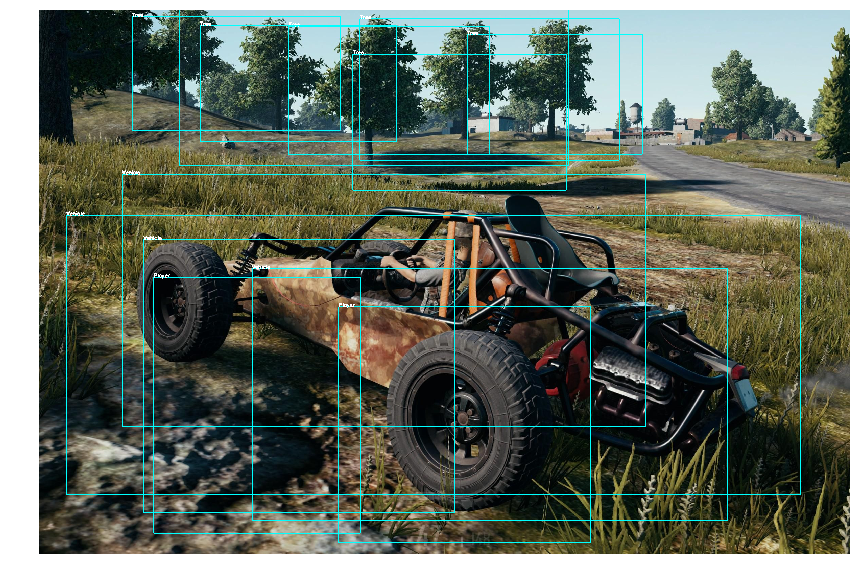

FileNotFoundError: [Errno 2] No such file or directory: '/home/jupyter/data/imageSets/test.txt'

In [3]:
#Run this cell to test and evaluate the model.
#You can run this cell directly without running the above. 
#Please remember to specify the path to the weight file you have trained, or use the weight file we provided.

%matplotlib inline
import sys
sys.path.append("../SystemCode")
from ssd300 import ssd_mobilenet
from ssd300  import keras_ssd_loss
from ssd300 import ssd_box_encode_decode_utils
from ssd300 import ssd_batch_generator
import numpy as np 
import cv2
import numpy as np
from keras.optimizers import Adam
import os
import h5py
import keras
import time
from keras.preprocessing import image
os.environ['CUDA_VISIBLE_DEVICES'] = "1"
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [20,10]

def cv2plt(img):
    plt.axis('off')
    if np.size(img.shape) == 3:
        plt.imshow(img)
    else:
        plt.imshow(img,cmap='gray',vmin=0,vmax=255)
    plt.show()

classes = ['background','Player', 'Gun', 'Vehicle', 'House', 'Tree', 'Plane']
# 1: Build the Keras model

# K.clear_session()  # Clear previous models from memory.

img_height = 300  # Height of the input images
img_width = 300  # Width of the input images
img_channels = 3  # Number of color channels of the input images
subtract_mean = [123, 117, 104]  # The per-channel mean of the images in the dataset
swap_channels = True  # The color channel order in the original SSD is BGR
n_classes = 6  # Number of positive classes, e.g. 20 for Pascal VOC, 80 for MS COCO
scales_voc = [0.1, 0.2, 0.37, 0.54, 0.71, 0.88,
              1.05]  # The anchor box scaling factors used in the original SSD300 for the Pascal VOC datasets
scales_coco = [0.07, 0.15, 0.33, 0.51, 0.69, 0.87,
               1.05]  # The anchor box scaling factors used in the original SSD300 for the MS COCO datasets
scales = scales_voc

aspect_ratios = [[1.0, 2.0, 0.5],
                 [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0 / 3.0],
                 [1.0, 2.0, 0.5],
                 [1.0, 2.0, 0.5]]  # The anchor box aspect ratios used in the original SSD300; the order matters
two_boxes_for_ar1 = True
steps = [8, 16, 32, 64, 100, 300]  # The space between two adjacent anchor box center points for each predictor layer.
offsets = [0.5, 0.5, 0.5, 0.5, 0.5,
           0.5]  # The offsets of the first anchor box center points from the top and left borders of the image as a fraction of the step size for each predictor layer.
limit_boxes = False  # Whether or not you want to limit the anchor boxes to lie entirely within the image boundaries
variances = [0.1, 0.1, 0.2,
             0.2]  # The variances by which the encoded target coordinates are scaled as in the original implementation
coords = 'centroids'  # Whether the box coordinates to be used as targets for the model should be in the 'centroids', 'corners', or 'minmax' format, see documentation
normalize_coords = True


model = ssd_mobilenet.ssd_300("training",
                image_size=(img_height, img_width, img_channels),
                n_classes=n_classes,
                l2_regularization=0.0005,
                scales=scales,
                aspect_ratios_per_layer=aspect_ratios,
                two_boxes_for_ar1=two_boxes_for_ar1,
                steps=steps,
                offsets=offsets,
                limit_boxes=limit_boxes,
                variances=variances,
                coords=coords,
                normalize_coords=normalize_coords,
                subtract_mean=subtract_mean,
                divide_by_stddev=None,
                swap_channels=swap_channels)

for layer in model.layers:
    layer.name = layer.name + "_v1"


#specify the path to the weight file you have trained.
model.load_weights("../Miscellaneous/checkpoints/ssd300_epoch-200.h5")


#specify the path to the images you want to test.
dir_path = "../Miscellaneous/data/test_images/"

for file in os.listdir(dir_path):
    filename = dir_path + file

    print(filename)

    img = cv2.imread(filename)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    orig_images = []  # Store the images here.
    input_images = []  # Store resized versions of the images here.
    orig_images.append(img)

    ima = img
    image1 = cv2.resize(img,(300,300))
    image1 = np.array(image1,dtype=np.float32)

    image1 = image1[np.newaxis,:,:,:]
    input_images = np.array(image1)


    start_time = time.time()


    y_pred = model.predict(input_images)

    print("time taken by ssd", time.time() - start_time)


    y_pred_decoded = ssd_box_encode_decode_utils.decode_y(y_pred=y_pred,
                                  confidence_thresh=0.25,
                                  iou_threshold=0.5,
                                  top_k=100,
                                  input_coords='centroids',
                                  normalize_coords=True,
                                  img_height=img_height,
                                  img_width=img_width)

    for box in y_pred_decoded[0]:

        xmin = int(box[-4] * orig_images[0].shape[1] / img_width)
        ymin = int(box[-3] * orig_images[0].shape[0] / img_height)
        xmax = int(box[-2] * orig_images[0].shape[1] / img_width)
        ymax = int(box[-1] * orig_images[0].shape[0] / img_height)
        class_id = int(box[0])
        score = box[1]
        print("class id:",class_id)
        print("score:",score)
        label = classes[class_id]
        # print int(box[-4]), int(box[-2]) , int(box[-3]) , int(box[-1])
        print("bounding box:",xmin,xmax,ymin,ymax)
        cv2.rectangle(orig_images[0],(xmin, ymin), (xmax, ymax),(0,255,255),2)
        cv2.putText(orig_images[0], label, (xmin, ymin), cv2.FONT_HERSHEY_SIMPLEX, .5, (255, 255, 255),2) 

    cv2plt(orig_images[0])
    
    
def compute_overlap(a, b):
    """
    Code originally from https://github.com/rbgirshick/py-faster-rcnn.
    Parameters
    ----------
    a: (N, 4) ndarray of float
    b: (K, 4) ndarray of float
    Returns
    -------
    overlaps: (N, K) ndarray of overlap between boxes and query_boxes
    """
    area = (b[:, 2] - b[:, 0]) * (b[:, 3] - b[:, 1])

    iw = np.minimum(np.expand_dims(a[:, 2], axis=1), b[:, 2]) - np.maximum(np.expand_dims(a[:, 0], 1), b[:, 0])
    ih = np.minimum(np.expand_dims(a[:, 3], axis=1), b[:, 3]) - np.maximum(np.expand_dims(a[:, 1], 1), b[:, 1])

    iw = np.maximum(iw, 0)
    ih = np.maximum(ih, 0)

    ua = np.expand_dims((a[:, 2] - a[:, 0]) * (a[:, 3] - a[:, 1]), axis=1) + area - iw * ih

    ua = np.maximum(ua, np.finfo(float).eps)

    intersection = iw * ih

    return intersection / ua


def compute_ap(recall, precision):
    """ Compute the average precision, given the recall and precision curves.
    Code originally from https://github.com/rbgirshick/py-faster-rcnn.

    # Arguments
        recall:    The recall curve (list).
        precision: The precision curve (list).
    # Returns
        The average precision as computed in py-faster-rcnn.
    """
    # correct AP calculation
    # first append sentinel values at the end
    mrec = np.concatenate(([0.], recall, [1.]))
    mpre = np.concatenate(([0.], precision, [0.]))

    # compute the precision envelope
    for i in range(mpre.size - 1, 0, -1):
        mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

    # to calculate area under PR curve, look for points
    # where X axis (recall) changes value
    i = np.where(mrec[1:] != mrec[:-1])[0]

    # and sum (\Delta recall) * prec
    ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap
conf_threshold = 0.5
dataset = ssd_batch_generator.BatchGenerator(box_output_format=['class_id', 'xmin', 'ymin', 'xmax', 'ymax'])

images_dir = '/home/jupyter/data/images'

# The directories that contain the annotations.
annotations_dir = '/home/jupyter/data/annotations'


# The paths to the image sets.
train_image_set_filename = '/home/jupyter/data/imageSets/trainval.txt'

val_image_set_filename = '/home/jupyter/data/imageSets/test.txt'


# The XML parser needs to now what object class names to look for and in which order to map them to integers.
classes = ['background','Player', 'Gun', 'Vehicle', 'House', 'Tree', 'Plane']


filenames, labels, image_ids = dataset.parse_xml(images_dirs=[images_dir],
                                                         image_set_filenames=[val_image_set_filename],
                                                         annotations_dirs=[annotations_dir],
                                                         classes=classes,
                                                         include_classes='all',
                                                         exclude_truncated=False,
                                                         exclude_difficult=False,
                                                         ret=True)


size = len(filenames)
detected_labels = []


all_detections = [[None for i in range(len(classes))] for j in range(size)]
all_annotations = [[None for i in range(len(classes))] for j in range(size)]

for i in range(size):

    image_path = filenames[i]
    ima = cv2.imread(image_path)
    orig_images = []

    orig_images.append(ima)

    image1 = cv2.resize(ima,(img_height,img_width))
    image1 = image1[np.newaxis,:,:,:]

    input_images = np.array(image1)


    start_time = time.time()
    y_pred = model.predict(input_images)
    print("Time Taken by ssd", time.time() - start_time)
    y_pred_decoded = ssd_box_encode_decode_utils.decode_y(y_pred=y_pred,
                                  confidence_thresh=0.25,
                                  iou_threshold=0.5,
                                  top_k=100,
                                  input_coords='centroids',
                                  normalize_coords=True,
                                  img_height=img_height,
                                  img_width=img_width)

    pred_boxes = []
    pred_labels = []

    for box in y_pred_decoded[0]:

        xmin = int(box[-4] * orig_images[0].shape[1] / img_width)
        ymin = int(box[-3] * orig_images[0].shape[0] / img_height)
        xmax = int(box[-2] * orig_images[0].shape[1] / img_width)
        ymax = int(box[-1] * orig_images[0].shape[0] / img_height)
        class_id = int(box[0])
        score = box[1]

        pred_boxes.append([xmin, ymin, xmax, ymax, score])

        pred_labels.append(class_id)

    pred_boxes = np.array(pred_boxes)
    pred_labels = np.array(pred_labels)

    l = range(1, len(classes))
    for label in l:
        if(len(pred_labels)):
            all_detections[i][label] = pred_boxes[pred_labels == label, :]

    true_label = np.array(labels[i])
        
    for label in l:
        if len(true_label) > 0:
            all_annotations[i][label] = true_label[true_label[:, 0] == label, 1:5].copy()
        else:
            all_annotations[i][label] = np.array([[]])

average_precisions = {}


for label in l:
    false_positives = np.zeros((0,))
    true_positives = np.zeros((0,))
    scores = np.zeros((0,))
    num_annotations = 0.0

    for i in range(size):
        annotations = all_annotations[i][label]
        annotations = annotations.astype(np.float32)


        num_annotations += annotations.shape[0]
        detected_annotations = []
        detections = all_detections[i][label]
        if(detections is not None):
            detections = detections.astype(np.float32)

            for d in detections:
                scores = np.append(scores, d[4])

                try:
                    annotations[0][0]
                except IndexError:
                    false_positives = np.append(false_positives, 1)
                    true_positives = np.append(true_positives, 0)
                    continue

                overlaps = compute_overlap(np.expand_dims(d, axis=0), annotations)
                assigned_annotation = np.argmax(overlaps, axis=1)
                max_overlap = overlaps[0, assigned_annotation]
                    
                if max_overlap >= conf_threshold and assigned_annotation not in detected_annotations:
                    
                    false_positives = np.append(false_positives, 0)
                    true_positives = np.append(true_positives, 1)
                    detected_annotations.append(assigned_annotation)
                else:
                    false_positives = np.append(false_positives, 1)
                    true_positives = np.append(true_positives, 0)

        
    if num_annotations == 0:
        average_precisions[label] = 0
        continue
    indices = np.argsort(-scores)
    false_positives = false_positives[indices]
    true_positives = true_positives[indices]

    false_positives = np.cumsum(false_positives)
    true_positives = np.cumsum(true_positives)

    recall = true_positives / num_annotations
        
    precision = true_positives / np.maximum(true_positives + false_positives, np.finfo(np.float64).eps)

    average_precision = compute_ap(recall, precision)
    average_precisions[label] = average_precision


count = 0
for k in average_precisions.keys():
    count  = count + float(average_precisions[k])



map = count/len(l)
print("average precisions of each class:",average_precisions)
print('MAP is :' , map)